In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV 
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score 
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.metrics import accuracy_score

In [3]:
df = pd.read_csv('Cleaned Data with States.csv')
df.head()

,Unnamed: 0,Alcohol,Appellation,Category,Points,Price,Review,Wine,Winery,Year,Variety,State
0,0,14.9,"Russian River Valley, Sonoma, California, US",Red,87,42.00,"Baked plum, licorice and lavender aromas and f...",V. Sattui 2015 Gilsson Vineyard Old Vine Zinfa...,V. Sattui,2015.0,Zinfandel,California
1,1,14.5,"Central Coast, Central Coast, California, US",Red,87,19.98,Pomegranate and light baking-spice aromas show...,Wente 2014 Coastal Selection Pinot Noir (Centr...,Wente,2014.0,Pinot Noir,California
2,2,13.8,California Republic,Red,86,15.00,Butter and vanilla notes dominate the jammy fr...,California Republic 2016 Cabernet Sauvignon (C...,California Republic,2016.0,Cabernet Sauvignon,California
3,3,13.8,"Lodi, Central Valley, California, US",Red,86,10.00,An aroma like toasted almonds and wood smoke m...,Collier Creek 2015 Red Wagon Pinot Noir (Lodi),Collier Creek,2015.0,Pinot Noir,California
4,4,13.0,"New Jersey, US",Red,86,27.00,Plum skin and pomegranate lead the nose while ...,DiLuca 2016 Rosso Black Label Red,DiLuca,2016.0,Red Blend,NaN


In [3]:
len(df)

129971

In [4]:
df.variety.describe()

count         129970
unique           707
top       Pinot Noir
freq           13272
Name: variety, dtype: object

## Find out how many null values exist and get rid of the features with the most null vals

In [5]:

df.isna().sum()

Unnamed: 0                   0
country                     63
description                  0
designation              37465
points                       0
price                     8996
province                    63
region_1                 21247
region_2                 79460
taster_name              26244
taster_twitter_handle    31213
title                        0
variety                      1
winery                       0
dtype: int64

In [4]:
# region_2 and twitter handle have the most null values so dropping the column
df_cleaned1 = df.drop(['Unnamed: 0','Review','Wine'],axis=1)
df_cleaned1

,Alcohol,Appellation,Category,Points,Price,Winery,Year,Variety,State
0,14.9,"Russian River Valley, Sonoma, California, US",Red,87,42.00,V. Sattui,2015.0,Zinfandel,California
1,14.5,"Central Coast, Central Coast, California, US",Red,87,19.98,Wente,2014.0,Pinot Noir,California
2,13.8,California Republic,Red,86,15.00,California Republic,2016.0,Cabernet Sauvignon,California
3,13.8,"Lodi, Central Valley, California, US",Red,86,10.00,Collier Creek,2015.0,Pinot Noir,California
4,13.0,"New Jersey, US",Red,86,27.00,DiLuca,2016.0,Red Blend,NaN
5,14.7,"Green Valley, Sonoma, California, US",Red,86,65.00,Dutton Estate,2016.0,Pinot Noir,California
6,13.8,"Columbia Valley (WA), Columbia Valley, Washing...",Red,86,30.00,Gordon Estate,2014.0,Red Blend,Washington
7,13.5,K Squared Cellars,White,86,24.00,K Squared Cellars,2017.0,Sauvignon Blanc,NaN
8,14.5,"Sonoma Valley, Sonoma, California, US",White,86,30.00,Kunde,2016.0,Chardonnay,California
9,14.2,"Russian River Valley, Sonoma, California, US",Red,86,45.00,Mengler Family Wines,2016.0,Sangiovese,California


In [7]:
list(df_cleaned1.columns.values)

['country',
 'description',
 'designation',
 'points',
 'price',
 'province',
 'region_1',
 'taster_name',
 'title',
 'variety',
 'winery']

In [5]:
df_cleaned1.describe(include= 'all')

,Alcohol,Appellation,Category,Points,Price,Winery,Year,Variety,State
count,4768.000000,4768,4768,4768.000000,4768.000000,4768,4768.000000,4768,3392
unique,NaN,945,7,NaN,NaN,1520,NaN,117,4
top,NaN,"Russian River Valley, Sonoma, California, US",Red,NaN,NaN,Maryhill,NaN,Pinot Noir,California
freq,NaN,214,3118,NaN,NaN,38,NaN,1058,2209
mean,13.949778,NaN,NaN,89.340185,42.290271,NaN,2015.419044,NaN,NaN
std,0.950407,NaN,NaN,2.784258,32.311230,NaN,1.154587,NaN,NaN
min,8.000000,NaN,NaN,80.000000,5.000000,NaN,2004.000000,NaN,NaN
25%,13.500000,NaN,NaN,87.000000,24.000000,NaN,2015.000000,NaN,NaN
50%,14.100000,NaN,NaN,90.000000,35.000000,NaN,2015.000000,NaN,NaN
75%,14.500000,NaN,NaN,91.000000,50.000000,NaN,2016.000000,NaN,NaN


In [6]:
df_cleaned1.isna().sum()

Alcohol           0
Appellation       0
Category          0
Points            0
Price             0
Winery            0
Year              0
Variety           0
State          1376
dtype: int64

In [7]:
df_cleaned4 = df_cleaned1.dropna()
len(df_cleaned4)

3392

In [20]:
df_cleaned4.describe(include='all')


,Alcohol,Appellation,Category,Points,Price,Winery,Year,Variety,State
count,3392.000000,3392,3392,3392.000000,3392.000000,3392,3392.000000,3392,3392
unique,NaN,157,7,NaN,NaN,1138,NaN,88,4
top,NaN,"Russian River Valley, Sonoma, California, US",Red,NaN,NaN,Maryhill,NaN,Pinot Noir,California
freq,NaN,214,2290,NaN,NaN,27,NaN,865,2209
mean,13.987689,NaN,NaN,89.727594,46.435018,NaN,2015.354363,NaN,NaN
std,0.970646,NaN,NaN,2.767949,35.128579,NaN,1.187030,NaN,NaN
min,8.200000,NaN,NaN,81.000000,5.000000,NaN,2004.000000,NaN,NaN
25%,13.500000,NaN,NaN,88.000000,26.000000,NaN,2015.000000,NaN,NaN
50%,14.200000,NaN,NaN,90.000000,40.000000,NaN,2015.000000,NaN,NaN
75%,14.500000,NaN,NaN,92.000000,55.000000,NaN,2016.000000,NaN,NaN


# Potential target variables to Predict based on data above:
- color: there are 3 unique colors
- country: there are 7 unique countries
- points - below mean or above mean?
- price - below mean or above mean?
- taster name - based on the language they used?
- the variety of wine? - pinot noir etc (there are 434 total wine varieties)

## 2. Classification Tree

In [18]:
# implementing the tree using scikit learn
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn.datasets as datasets
import pandas as pd
import numpy as np
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
from sklearn.metrics import mean_squared_error
#import matplotlib.pyplot as plt
#import seaborn as sns

In [24]:
labels = df_cleaned4['Variety']
labels_removed_df = df_cleaned4.drop(['Variety'],axis = 1)
labels_removed_df.head()

,Alcohol,Appellation,Category,Points,Price,Winery,Year,State
0,14.9,"Russian River Valley, Sonoma, California, US",Red,87,42.00,V. Sattui,2015.0,California
1,14.5,"Central Coast, Central Coast, California, US",Red,87,19.98,Wente,2014.0,California
2,13.8,California Republic,Red,86,15.00,California Republic,2016.0,California
3,13.8,"Lodi, Central Valley, California, US",Red,86,10.00,Collier Creek,2015.0,California
5,14.7,"Green Valley, Sonoma, California, US",Red,86,65.00,Dutton Estate,2016.0,California


In [25]:
X = pd.get_dummies(labels_removed_df)
X.head()

,Alcohol,Points,Price,Year,"Appellation_Adelaida District, Central Coast, California, US","Appellation_Alexander Valley, Sonoma, California, US","Appellation_Alta Mesa, Central Valley, California, US","Appellation_Amador County, Sierra Foothills, California, US","Appellation_Ancient Lakes, Columbia Valley, Washington, US","Appellation_Anderson Valley, Mendocino County, California, US",...,Winery_Zeitgeist,Winery_Zinfandelic,Winery_Zotovich,Winery_van Loben Sels,Winery_Écluse,Winery_Órale,State_California,State_New York,State_Oregon,State_Washington
0,14.9,87,42.00,2015.0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
1,14.5,87,19.98,2014.0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
2,13.8,86,15.00,2016.0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
3,13.8,86,10.00,2015.0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
5,14.7,86,65.00,2016.0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0


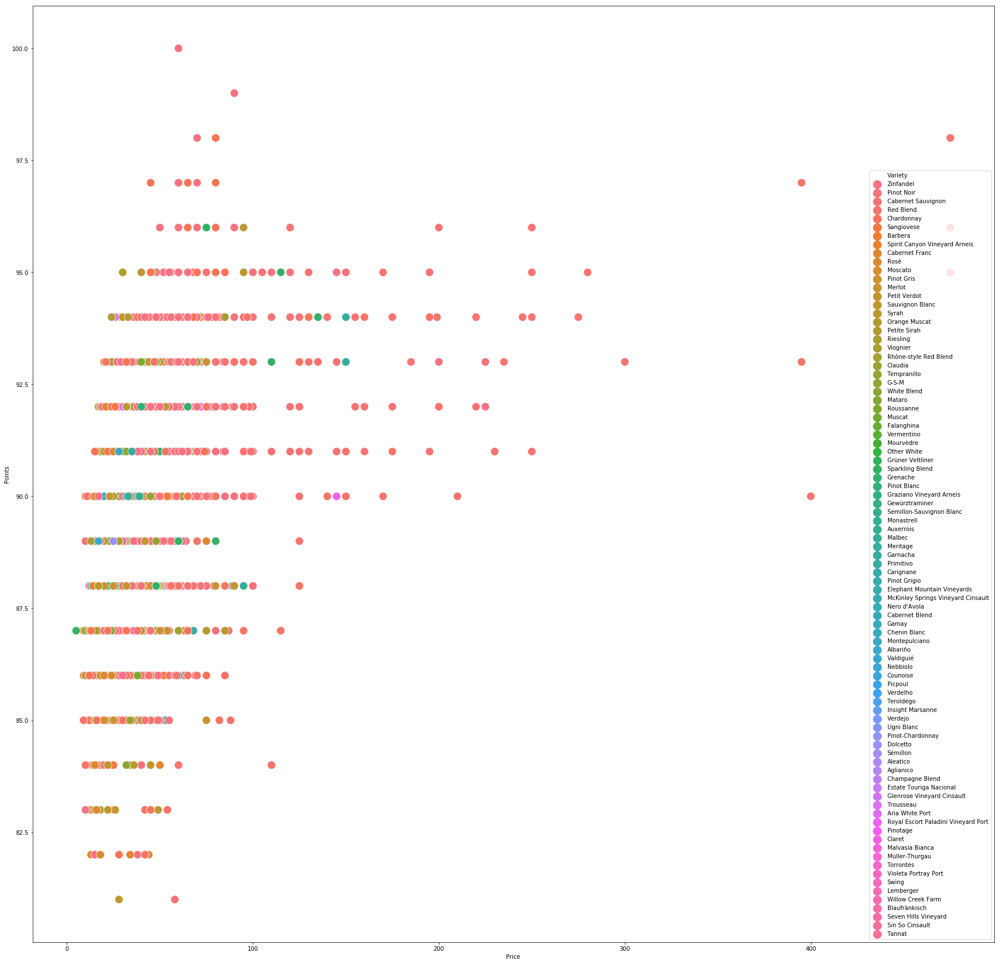

In [42]:
import seaborn as sns
fig = plt.figure(figsize = (30,30))
# cmap = sns.cubehelix_palette(dark=.3, light=.8, as_cmap=True)
sns.scatterplot(x = df_cleaned4['Price'], y = df_cleaned4['Points'], hue = df_cleaned4 ['Variety'], sizes=(200, 200), size=df_cleaned4 ['Variety'])

In [43]:
y = labels

In [44]:
X_train,X_test,y_train,y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

In [45]:
#start off with a very small depth
from sklearn.tree import DecisionTreeClassifier
ctree=DecisionTreeClassifier(max_depth = 2)
ctree.fit(X_train,y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=2,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

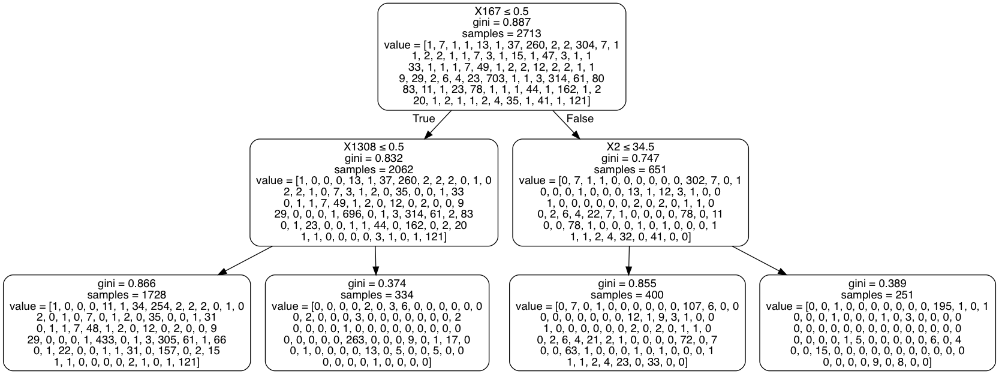

In [46]:
dot_data = StringIO()
export_graphviz(ctree, out_file=dot_data,  
                rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [49]:
X.columns[167],X.columns[1308],X.columns[2]

('Category_White', 'State_Oregon', 'Price')

### Category_White', 'State_Oregon', 'Price' = the most important separators

In [50]:
clasPred = ctree.predict(X_test)

In [51]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test, clasPred)

0.3446244477172312

/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:652: Warning: The least populated class in y has only 1 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)
/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:652: Warning: The least populated class in y has only 1 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)
/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:652: Warning: The least populated class in y has only 1 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)
/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:652: Warning: The least populated class in y has only 1 members, which is too few. The minimum number 

[0.36473944062647223, 0.3677779021649337, 0.39219869558605197, 0.4110455144541779, 0.4473206186165144, 0.4681141072779794, 0.47379997591863726, 0.4923499467886848, 0.5038454095195685]


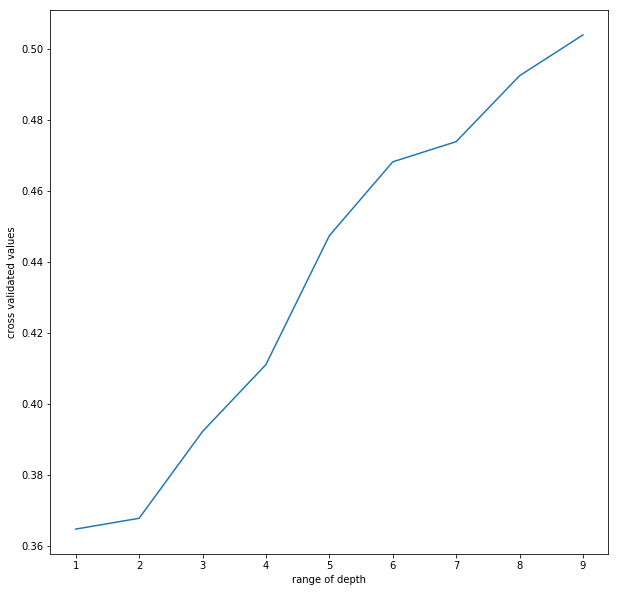

In [52]:
from sklearn.model_selection import cross_val_score
score = cross_val_score(ctree, X, y, cv = 10)
score.mean()
depth_range = range(1,10)
val = []
for depth in depth_range:
    ctree = DecisionTreeClassifier(max_depth = depth)
    depth_score = cross_val_score(ctree, X, y, cv = 10)
    val.append(depth_score.mean())
print(val)
plt.figure(figsize = (10,10))
plt.plot(depth_range, val)
plt.xlabel('range of depth')
plt.ylabel('cross validated values')
plt.show()

/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:652: Warning: The least populated class in y has only 1 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)
/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:652: Warning: The least populated class in y has only 1 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)
/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:652: Warning: The least populated class in y has only 1 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)
/anaconda3/lib/python3.6/site-packages/sklearn/model_selection/_split.py:652: Warning: The least populated class in y has only 1 members, which is too few. The minimum number 

[0.5029442862398408, 0.5014612068227875, 0.5090957941431425, 0.5036453406204479, 0.5049880739783987, 0.49713249997971404, 0.49570264009958376, 0.49231278238350784, 0.4896438233929271, 0.4896101797958477]


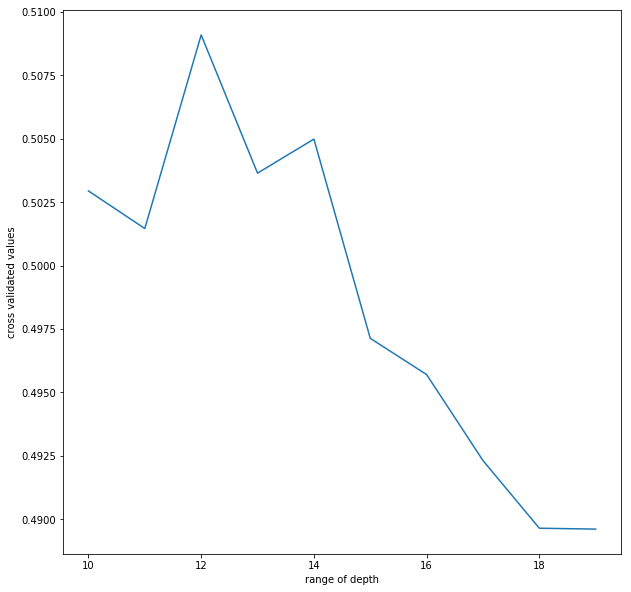

In [53]:
score = cross_val_score(ctree, X, y, cv = 10)
score.mean()
depth_range = range(10,20)
val = []
for depth in depth_range:
    ctree = DecisionTreeClassifier(max_depth = depth)
    depth_score = cross_val_score(ctree, X, y, cv = 10)
    val.append(depth_score.mean())
print(val)
plt.figure(figsize = (10,10))
plt.plot(depth_range, val)
plt.xlabel('range of depth')
plt.ylabel('cross validated values')
plt.show()

In [54]:
max(val)

0.5090957941431425

In [55]:
#try a different depth:
from sklearn.tree import DecisionTreeClassifier
ctree=DecisionTreeClassifier(max_depth = 12)
ctree.fit(X_train,y_train)
dot_data = StringIO()
export_graphviz(ctree, out_file=dot_data,  
                rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [30]:
clasPred = ctree.predict(X_test)
from sklearn.metrics import accuracy_score
accuracy_score(y_test, clasPred)

0.6928641490926924